In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# !cd drive/MyDrive/Terminal34/; unzip football-dataset.zip

In [3]:
!ls drive/MyDrive/Terminal34/images

'Frame 1  (100).jpg'		 'Frame 1  (3).jpg___fuse.png'	 'Frame 1  (6).jpg___save.png'
'Frame 1  (100).jpg___fuse.png'  'Frame 1  (3).jpg___save.png'	 'Frame 1  (70).jpg'
'Frame 1  (100).jpg___save.png'  'Frame 1  (40).jpg'		 'Frame 1  (70).jpg___fuse.png'
'Frame 1  (10).jpg'		 'Frame 1  (40).jpg___fuse.png'  'Frame 1  (70).jpg___save.png'
'Frame 1  (10).jpg___fuse.png'	 'Frame 1  (40).jpg___save.png'  'Frame 1  (71).jpg'
'Frame 1  (10).jpg___save.png'	 'Frame 1  (41).jpg'		 'Frame 1  (71).jpg___fuse.png'
'Frame 1  (11).jpg'		 'Frame 1  (41).jpg___fuse.png'  'Frame 1  (71).jpg___save.png'
'Frame 1  (11).jpg___fuse.png'	 'Frame 1  (41).jpg___save.png'  'Frame 1  (72).jpg'
'Frame 1  (11).jpg___save.png'	 'Frame 1  (42).jpg'		 'Frame 1  (72).jpg___fuse.png'
'Frame 1  (12).jpg'		 'Frame 1  (42).jpg___fuse.png'  'Frame 1  (72).jpg___save.png'
'Frame 1  (12).jpg___fuse.png'	 'Frame 1  (42).jpg___save.png'  'Frame 1  (73).jpg'
'Frame 1  (12).jpg___save.png'	 'Frame 1  (43).jpg'		 'Frame 1  (73).

In [4]:
import os
import keras
import numpy as np
import pandas as pd
import tensorflow as tf

from glob import glob
from tqdm import tqdm
import tensorflow.image as tfi
from tensorflow.keras.utils import load_img, img_to_array

import matplotlib.pyplot as plt

from keras.layers import add
from keras.layers import Input
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import multiply
from keras.layers import Dropout
from keras.layers import MaxPool2D
from keras.layers import Concatenate
from keras.layers import Conv2DTranspose
from keras.layers import BatchNormalization
from keras.callbacks import Callback, ModelCheckpoint
from keras.models import Model
from tensorflow.keras.layers import MaxPooling2D, Dropout, Conv2DTranspose, concatenate

from tensorflow.keras.utils import plot_model

In [5]:
# Root Path
image_paths = 'drive/MyDrive/Terminal34/images'

# All Images and thier respective maps
all_images = glob(os.path.join(image_paths, "*.jpg"))
all_paths = [path.replace(".jpg", ".jpg___fuse.png") for path in all_images]

In [6]:
all_paths

['drive/MyDrive/Terminal34/images/Frame 1  (2).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (1).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (14).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (11).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (22).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (12).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (15).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (18).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (19).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (10).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (21).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (16).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (20).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (23).jpg___fuse.png',
 'drive/MyDrive/Terminal34/images/Frame 1  (13).jpg___fuse.png',
 'drive/MyDrive/Terminal34/

In [7]:
def load_image(path, SIZE=256):
    image = load_img(path)
    image = tfi.resize(image, (SIZE, SIZE))
    image = img_to_array(image)
    image = tf.cast(image, tf.float32)
    image = image/255.
    return image

def load_data(image_paths, label_paths, SIZE=256):
    images, label_maps = np.zeros(
        shape=(len(image_paths), SIZE, SIZE, 3)), np.zeros(shape=(len(label_paths), SIZE, SIZE, 3))
    for i, (image_path, label_path) in tqdm(
        enumerate(zip(image_paths, label_paths)), desc="Loading"):
        image, label_map = load_image(image_path, SIZE=SIZE), load_image(label_path, SIZE=SIZE)
        images[i], label_maps[i] = image, label_map
    return images, label_maps

In [8]:
images, label_maps = load_data(all_images, all_paths)

Loading: 100it [00:20,  4.82it/s]


In [9]:
images.shape, label_maps.shape

((100, 256, 256, 3), (100, 256, 256, 3))

In [10]:
def show_map(image, label_map, alpha_1=1, alpha_2=0.7):
    plt.imshow(image, alpha=alpha_1)
    plt.imshow(label_map, alpha=alpha_2)
    plt.axis('off')

In [11]:
def show_maps(images, label_maps, GRID=[5,6], SIZE=(25,25)):

    # Plot Configuration
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    plt.figure(figsize=SIZE)

    # Iterate through the Data
    i=1
    for image, label_map in zip(images, label_maps):

        # Plot Image
        plt.subplot(n_rows, n_cols, i)
        show_map(image, label_map)

        i+=1
        if i>n_images:
            break

    # Final Plot
    plt.show()

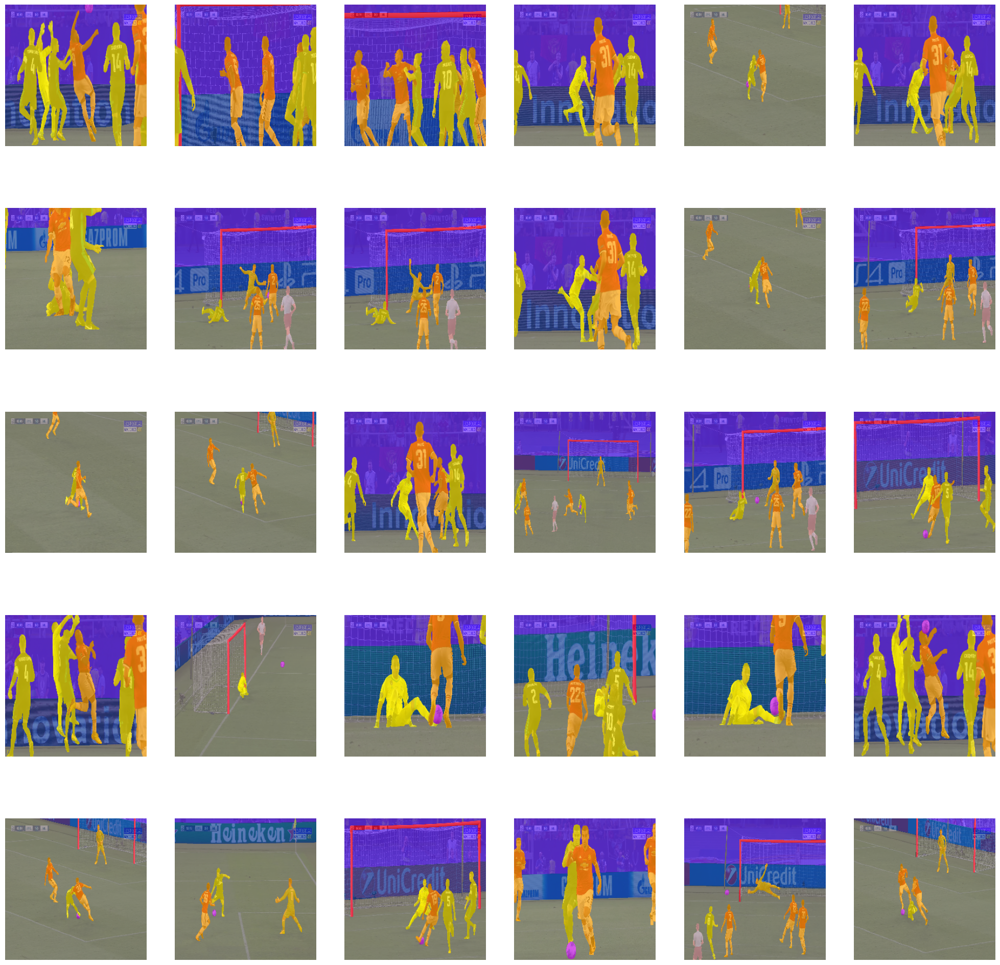

In [12]:
show_maps(images, label_maps)

In [13]:
np.unique(label_maps)

array([0.00000000e+00, 1.53186284e-05, 4.59558833e-05, ...,
       9.99954045e-01, 9.99984682e-01, 1.00000000e+00])

In [14]:
def unet(input_shape=(256, 256, 3), num_classes=2):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    # Bottom
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    drop5 = Dropout(0.5)(conv5)

    # Decoder
    up6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(drop5)
    merge6 = concatenate([drop4, up6], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(merge6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    merge7 = concatenate([conv3, up7], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(merge7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    merge8 = concatenate([conv2, up8], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(merge8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    merge9 = concatenate([conv1, up9], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(merge9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)

    outputs = Conv2D(3, kernel_size=3, padding='same', activation='sigmoid')(conv9)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

In [15]:
# Example usage
model = unet()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 128, 128, 64)         0         ['conv2d_1[0][0]']            
 D)                                                                                           

In [16]:
# Compile Model
model.compile(loss='binary_crossentropy', optimizer='adam')

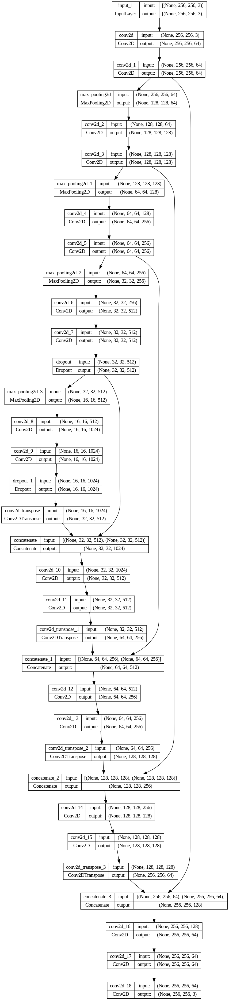

In [17]:
plot_model(model, "UNet.png", show_shapes=True)

In [18]:
BATCH_SIZE = 16
SPE = len(images)//BATCH_SIZE

In [19]:
def show_image(image, title=None):
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [20]:
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        id = np.random.randint(len(images))
        image = images[id]
        mask = label_maps[id]
        pred_mask = self.model(tf.expand_dims(image,axis=0))[0]

        plt.figure(figsize=(10,8))
        plt.subplot(1,3,1)
        show_image(image, title="Original Image")

        plt.subplot(1,3,2)
        show_image(mask, title="Original Mask")

        plt.subplot(1,3,3)
        show_image(pred_mask, title="Predicted Mask")

        plt.tight_layout()
        plt.show()

In [21]:
callbacks = [
    ModelCheckpoint("UNet-Footbal-Player-Segmentation.h5", save_best_only=True),
    ShowProgress()
]

Epoch 1/50
6/6 [==============================] - ETA: 0s - loss: 0.6886

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


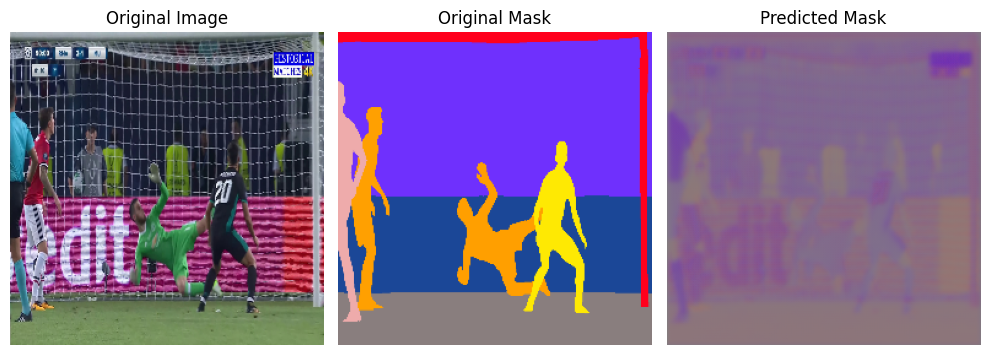

6/6 [==============================] - 82s 7s/step - loss: 0.6886 - val_loss: 0.6745
Epoch 2/50
6/6 [==============================] - ETA: 0s - loss: 0.6788

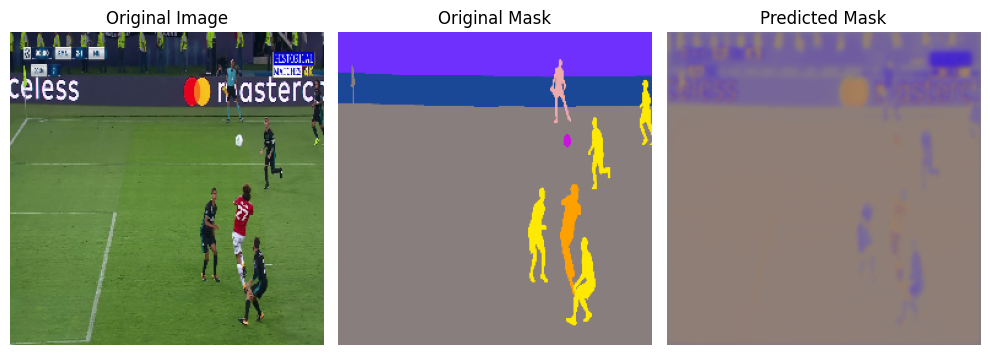

6/6 [==============================] - 7s 1s/step - loss: 0.6788 - val_loss: 0.6644
Epoch 3/50
6/6 [==============================] - ETA: 0s - loss: 0.6695

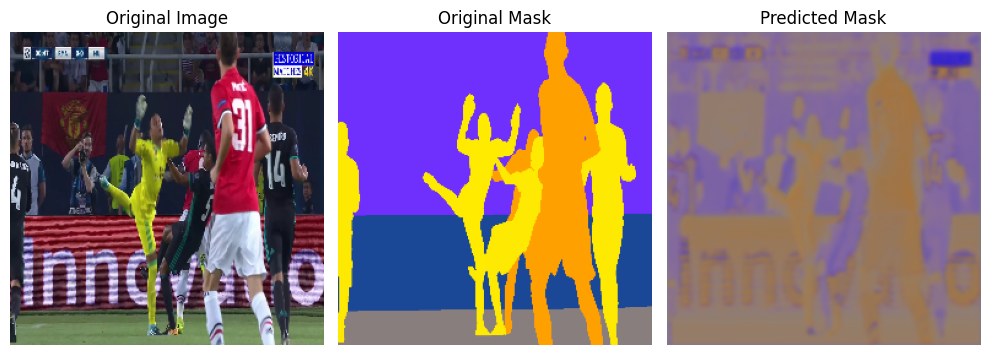

6/6 [==============================] - 6s 936ms/step - loss: 0.6695 - val_loss: 0.6650
Epoch 4/50
6/6 [==============================] - ETA: 0s - loss: 0.6628

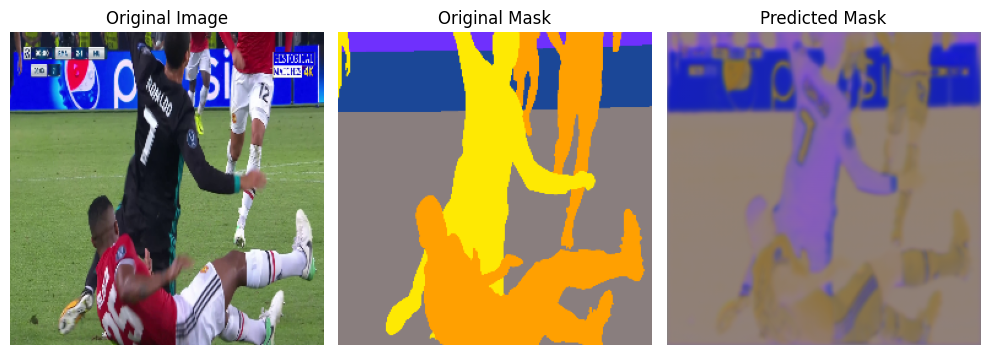

6/6 [==============================] - 7s 1s/step - loss: 0.6628 - val_loss: 0.6494
Epoch 5/50
6/6 [==============================] - ETA: 0s - loss: 0.6615

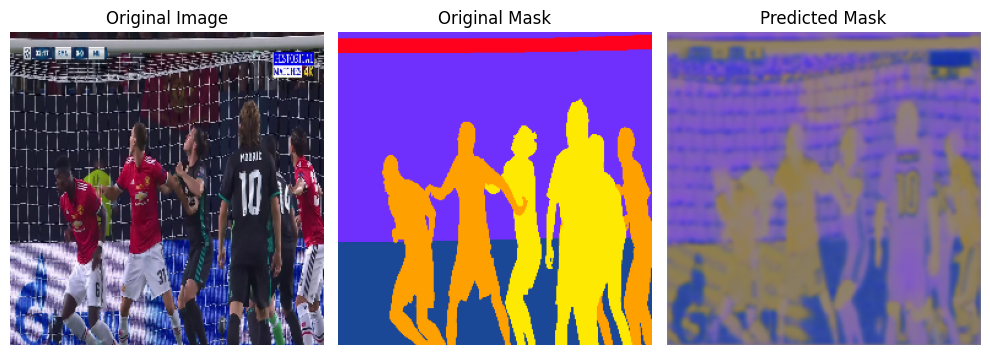

6/6 [==============================] - 6s 932ms/step - loss: 0.6615 - val_loss: 0.6549
Epoch 6/50
6/6 [==============================] - ETA: 0s - loss: 0.6559

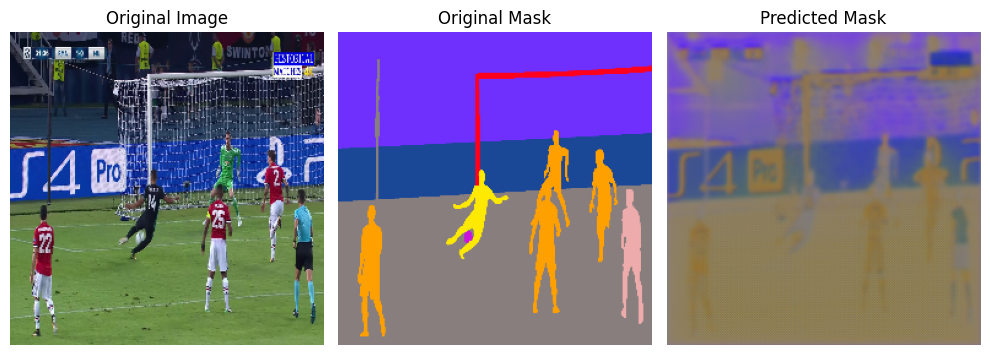

6/6 [==============================] - 5s 926ms/step - loss: 0.6559 - val_loss: 0.6686
Epoch 7/50
6/6 [==============================] - ETA: 0s - loss: 0.6559

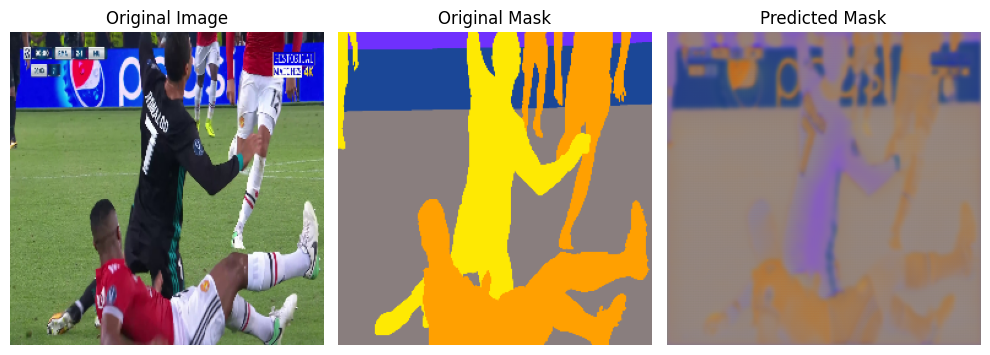

6/6 [==============================] - 5s 924ms/step - loss: 0.6559 - val_loss: 0.6551
Epoch 8/50
6/6 [==============================] - ETA: 0s - loss: 0.6489

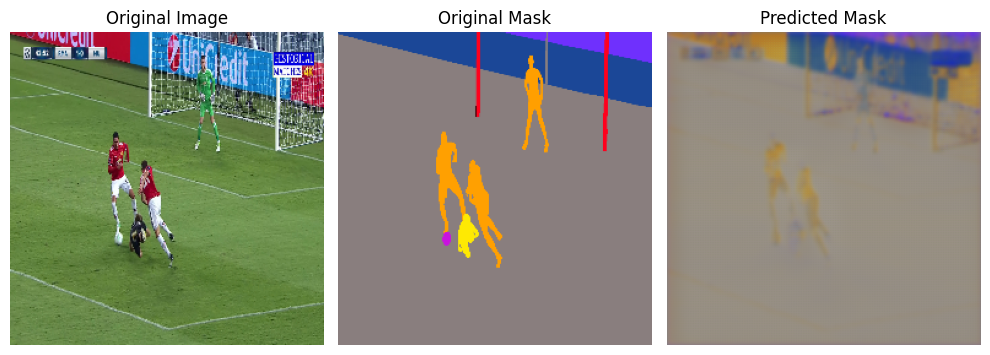

6/6 [==============================] - 6s 983ms/step - loss: 0.6489 - val_loss: 0.6496
Epoch 9/50
6/6 [==============================] - ETA: 0s - loss: 0.6394

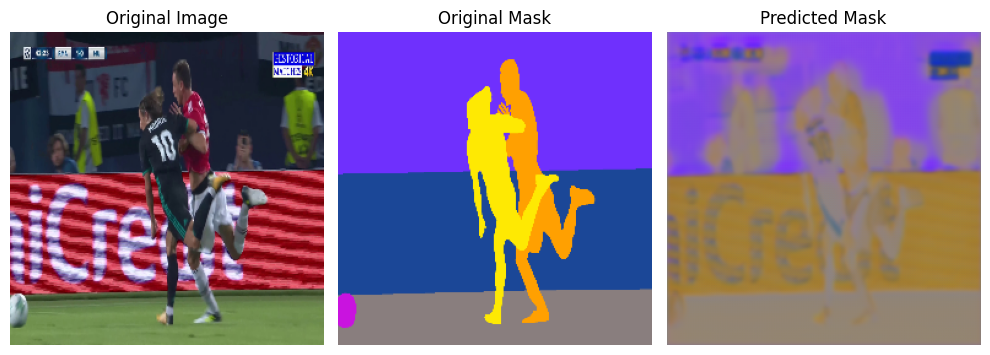

6/6 [==============================] - 7s 1s/step - loss: 0.6394 - val_loss: 0.6392
Epoch 10/50
6/6 [==============================] - ETA: 0s - loss: 0.6328

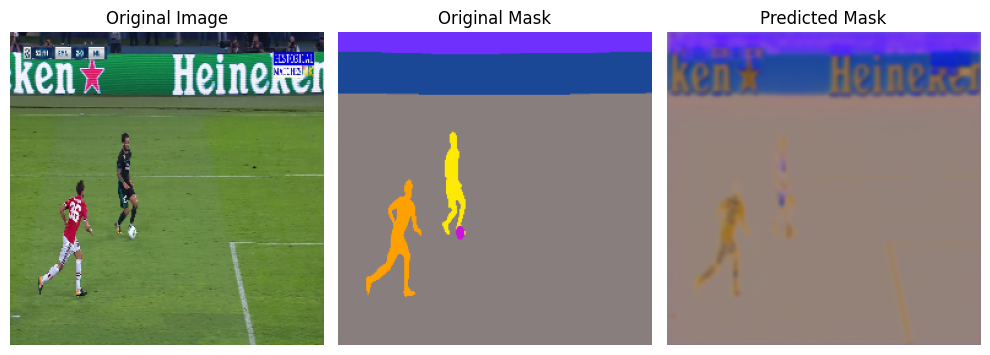

6/6 [==============================] - 7s 1s/step - loss: 0.6328 - val_loss: 0.6286
Epoch 11/50
6/6 [==============================] - ETA: 0s - loss: 0.6279

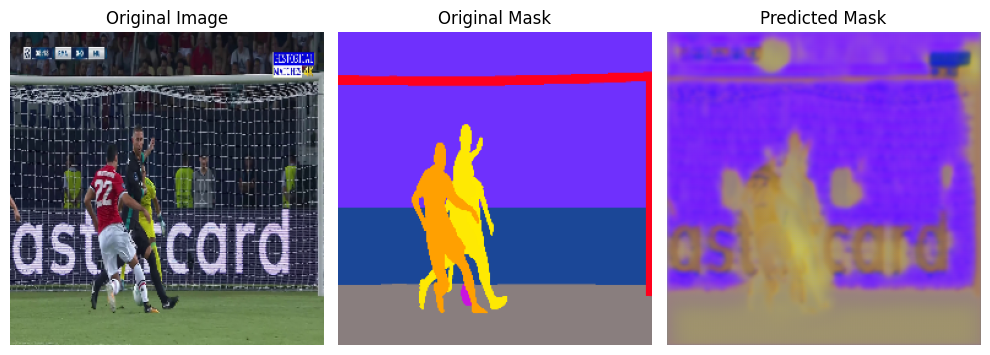

6/6 [==============================] - 6s 927ms/step - loss: 0.6279 - val_loss: 0.6325
Epoch 12/50
6/6 [==============================] - ETA: 0s - loss: 0.6249

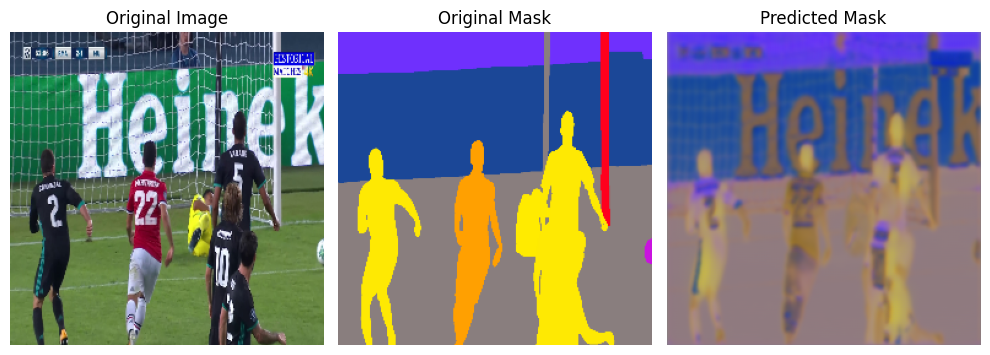

6/6 [==============================] - 6s 936ms/step - loss: 0.6249 - val_loss: 0.6299
Epoch 13/50
6/6 [==============================] - ETA: 0s - loss: 0.6201

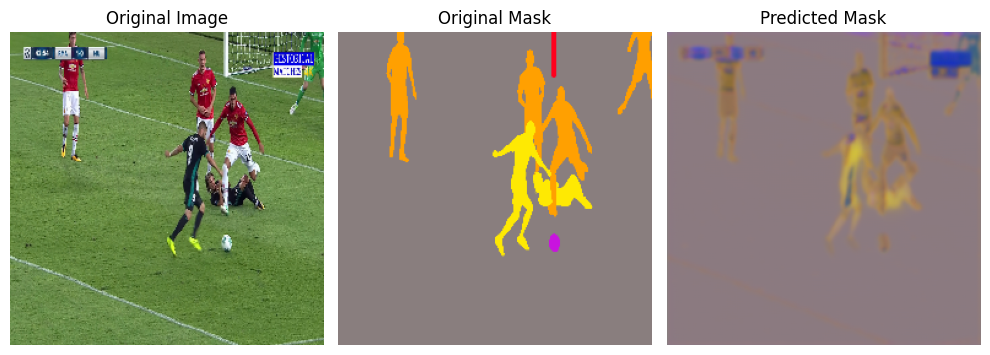

6/6 [==============================] - 7s 1s/step - loss: 0.6201 - val_loss: 0.6243
Epoch 14/50
6/6 [==============================] - ETA: 0s - loss: 0.6141

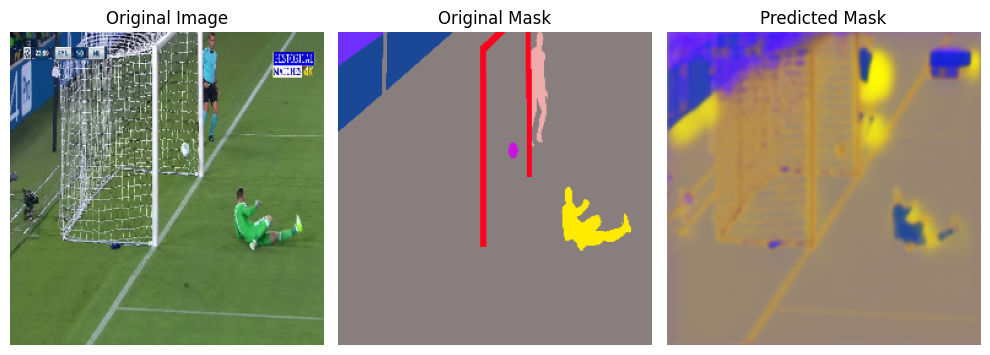

6/6 [==============================] - 7s 1s/step - loss: 0.6141 - val_loss: 0.6233
Epoch 15/50
6/6 [==============================] - ETA: 0s - loss: 0.6012

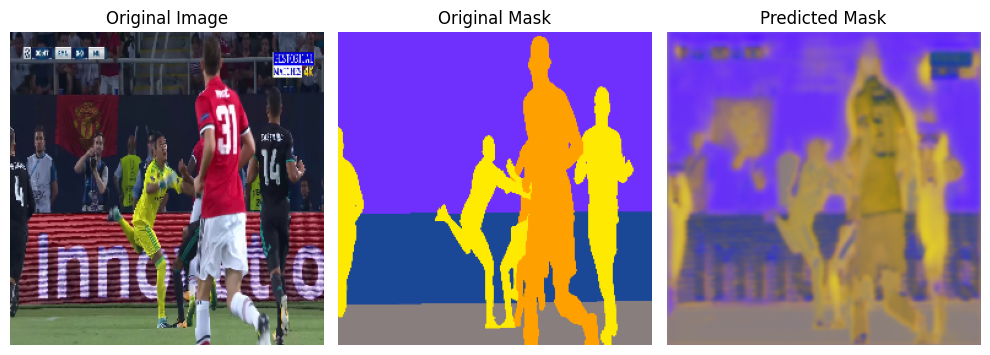

6/6 [==============================] - 7s 1s/step - loss: 0.6012 - val_loss: 0.6173
Epoch 16/50
6/6 [==============================] - ETA: 0s - loss: 0.5937

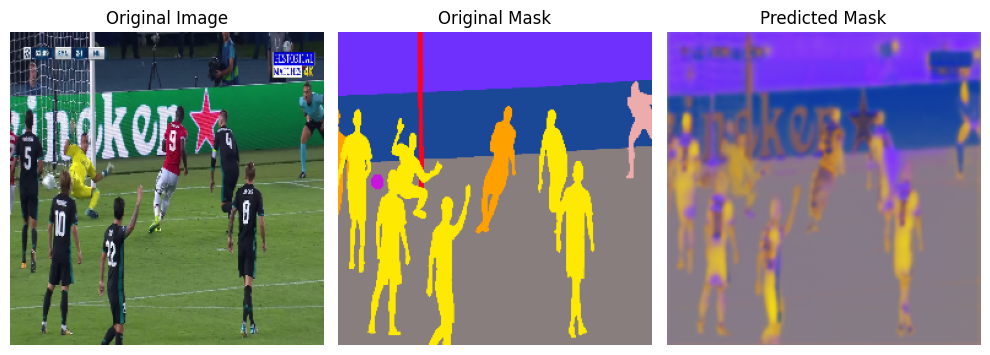

6/6 [==============================] - 6s 934ms/step - loss: 0.5937 - val_loss: 0.6234
Epoch 17/50
6/6 [==============================] - ETA: 0s - loss: 0.6104

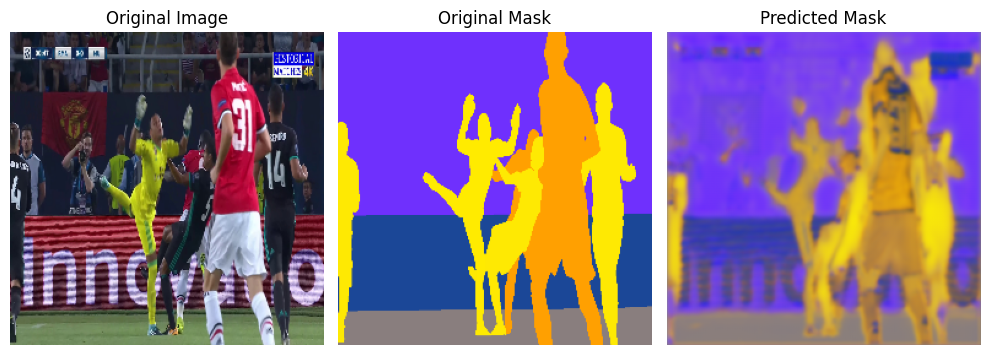

6/6 [==============================] - 9s 2s/step - loss: 0.6104 - val_loss: 0.6105
Epoch 18/50
6/6 [==============================] - ETA: 0s - loss: 0.5804

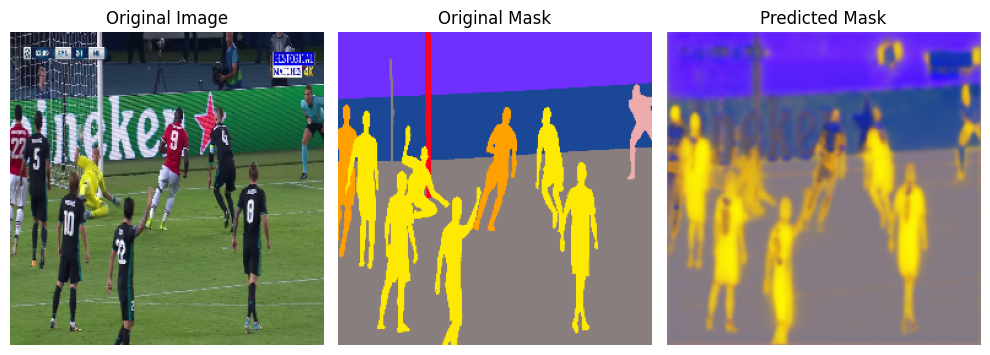

6/6 [==============================] - 8s 2s/step - loss: 0.5804 - val_loss: 0.6075
Epoch 19/50
6/6 [==============================] - ETA: 0s - loss: 0.6276

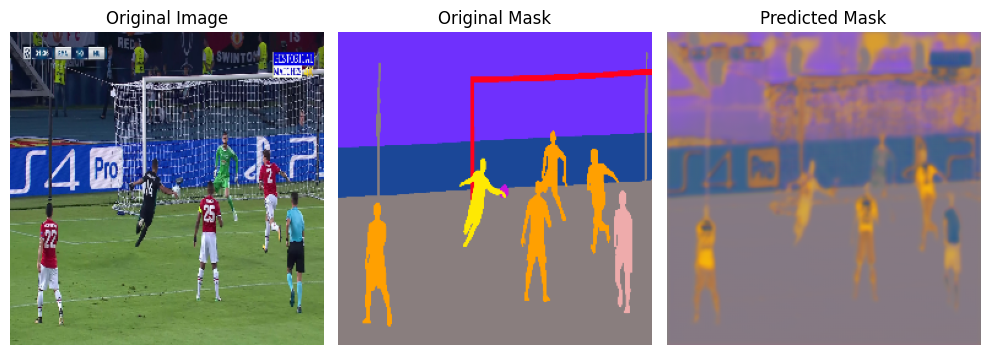

6/6 [==============================] - 7s 1s/step - loss: 0.6276 - val_loss: 0.6685
Epoch 20/50
6/6 [==============================] - ETA: 0s - loss: 0.6443

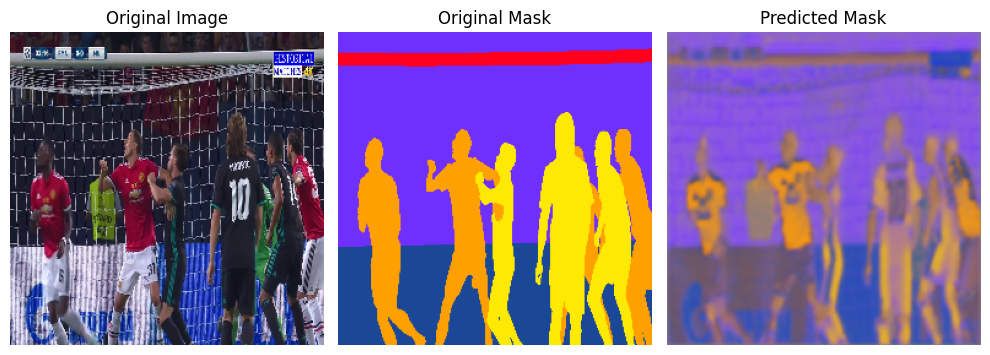

6/6 [==============================] - 6s 1s/step - loss: 0.6443 - val_loss: 0.6350
Epoch 21/50
1/6 [====>.........................] - ETA: 4s - loss: 0.6227

In [ ]:
model.fit(
    images, label_maps,
    validation_split=0.1,
    epochs=50,
    batch_size=BATCH_SIZE,
    steps_per_epoch=SPE,
    callbacks=callbacks
)